In [3]:
!git clone https://github.com/Doronbh7/segment-anything-2-fine-tune.git

fatal: destination path 'segment-anything-2-fine-tune' already exists and is not an empty directory.


In [22]:
import os
import re
import cv2
import json
import torch
import math
import random
import numpy as np
import pandas as pd
from box import Box
from PIL import Image
from roboflow import Roboflow
import matplotlib.pyplot as plt
from tbparse import SummaryReader
from pycocotools.coco import COCO
from kaggle_secrets import UserSecretsClient
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [5]:
# Initialize Roboflow
rf = Roboflow(UserSecretsClient().get_secret("roboflow api"))
rf_project = rf.workspace("concrete-inspections").project("crack-efflorescence-popout")
rf_version = rf_project.version(4)
rf_dataset = rf_version.download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


In [47]:
# Process annotations and images
def process_images(data_dir):
    structured_annotations = {}
    for sub_dir in os.listdir(data_dir):
        current_path = os.path.join(data_dir, sub_dir)
        if os.path.isdir(current_path):
            predict_dir = os.path.join(base_predict_dir,sub_dir)
            # Create output directory if not exists
            os.makedirs(predict_dir, exist_ok=True)
            
            # Initialize annotations for this subdirectory
            structured_annotations[sub_dir] = []
            
            # Load COCO annotations
            coco = COCO(os.path.join(current_path,"_annotations.coco.json"))

            color_map = {}
            id_to_class = {}

            for cat in coco.loadCats(coco.getCatIds()):
                if cat["id"] not in color_map:
                    random.seed(hash(cat["id"]))  # Use hash of id for reproducibility
                    color_map[cat["id"]] = [random.randint(0, 255) for _ in range(3)] # RGB format
                    id_to_class[cat["id"]] = cat["name"]
            
            for image_info in coco.loadImgs(coco.getImgIds()):
                image_id = image_info["id"]
                image_filename = image_info["file_name"]
                image_short_name = image_info["extra"]["name"].split(".")[0]
                image_path = os.path.join(current_path, image_filename)
                image = cv2.imread(image_path)
                
                if image is None:
                    print(f"Skipping {image_filename}, unable to load.")
                    continue
                    
                # Save the original image
                original_image_path = os.path.join(predict_dir, f"{image_short_name}_original.jpg")
                cv2.imwrite(original_image_path, image)
                
                # Set the image for prediction
                predictor.set_image(image)
                
                masks_combined = np.zeros(image.shape[:2], dtype=np.uint8)  # For combined labeled masks
                overlay_image = np.zeros(image.shape[:3], dtype=np.uint8)  # RGB overlay initialization
                image_annotations = []
            
                for annotation in coco.loadAnns(coco.getAnnIds(imgIds=[image_id])):
                    segmentation = annotation["segmentation"]
                    polygon = np.array(segmentation[0], dtype=np.float32).reshape(-1, 2)  # Nx2 array
                    class_id = annotation["category_id"]
                    class_label = id_to_class.get(class_id, "unknown")
                
                    # Predict masks using the SAM2 model
                    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
                        masks, scores,_ = predictor.predict(
                            point_coords=polygon,  # Use polygon as input points
                            point_labels=np.ones(len(polygon)),  # Labels: 1 for foreground
                        )
                        
                    # Select the best mask based on score
                    best_mask_idx = np.argmax(scores)  # Get the index of the mask with the highest score
                    best_mask = masks[best_mask_idx]
                    best_score = scores[best_mask_idx]
                    
                    # Create a labeled mask by embedding the class ID
                    labeled_mask = (best_mask * class_id).astype(np.uint8)
    
                    masks_combined = np.maximum(masks_combined, labeled_mask)  # Combine into labeled mask

                    # Apply dynamically generated color map for category ID
                    mask_color = color_map.get(class_id, [128, 128, 128])  # Default gray if unknown
                    
                    # Apply color map
                    for i in range(3):  # RGB channels
                        overlay_image[..., i][masks_combined == class_id] = color_map[class_id][i]
                    
                    # Save the individual labeled mask
                    mask_path = os.path.join(predict_dir, f"{image_short_name}_mask_{annotation['id']}.png")
                    cv2.imwrite(mask_path, labeled_mask)
                    
                    # Append annotation details
                    image_annotations.append({
                        "individual_mask": mask_path,
                        "label": class_label,
                        "class_id": class_id,
                        "best_score": str(best_score)
                    })

                # Generate final overlay by blending with the original image
                final_overlay = cv2.addWeighted(image, 0.7, overlay_image, 0.3, 0)
                
                # Save the combined labeled mask
                combined_mask_path = os.path.join(predict_dir, f"{image_short_name}_labeled_mask.png")
                cv2.imwrite(combined_mask_path, masks_combined)
            
                # Save the overlayed visualization
                overlayed_image_path = os.path.join(predict_dir, f"{image_short_name}_overlayed.png")
                cv2.imwrite(overlayed_image_path, final_overlay)
                
                # Save all annotations for this image
                structured_annotations[sub_dir].append({
                    "original_image": original_image_path,
                    "labeled_mask": combined_mask_path,
                    "overlayed_image": overlayed_image_path,
                    "annotations": image_annotations,
                })
                
    # Save the structured annotations JSON
    with open(os.path.join(base_predict_dir,"structured_annotations.json"), "w") as f:
        json.dump(structured_annotations, f, indent=4)

    print("All images processed and saved!")

In [58]:
def visualize_processed_images(base_predict_dir, sub_dir):
    """
    Visualize the processed images, including original, labeled masks, and overlayed images.
    Args:
        base_predict_dir (str): The base directory where processed images are saved.
        sub_dir (str): The subdirectory containing the processed images for a specific dataset split.
    """
    predict_dir = os.path.join(base_predict_dir, sub_dir)
    if not os.path.exists(predict_dir):
        print(f"Directory {predict_dir} does not exist.")
        return

    # Load structured annotations
    annotations_path = os.path.join(base_predict_dir, "structured_annotations.json")
    if not os.path.exists(annotations_path):
        print(f"Annotations file {annotations_path} not found.")
        return

    import json
    with open(annotations_path, "r") as f:
        structured_annotations = json.load(f)

    # Iterate through the annotations and visualize
    for image_data in structured_annotations.get(sub_dir, []):
        original_image_path = image_data["original_image"]
        labeled_mask_path = image_data["labeled_mask"]
        overlayed_image_path = image_data["overlayed_image"]
        

        # Load images
        original_image = cv2.imread(original_image_path)
        labeled_mask = cv2.imread(labeled_mask_path, cv2.IMREAD_GRAYSCALE)
        overlayed_image = cv2.imread(overlayed_image_path)

        if original_image is None or labeled_mask is None or overlayed_image is None:
            print(f"Skipping visualization for {original_image_path}, one or more images could not be loaded.")
            continue

        # Convert BGR to RGB for visualization
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        overlayed_image = cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB)

        # Plot the images
        fig, axes = plt.subplots(1, 3, figsize=(5, 5))
        axes[0].imshow(original_image)
        axes[0].set_title("Original Image")
        axes[0].axis("off")

        axes[1].imshow(labeled_mask, cmap="gray")
        axes[1].set_title("Labeled Mask")
        axes[1].axis("off")

        axes[2].imshow(overlayed_image)
        axes[2].set_title("Overlayed Image")
        axes[2].axis("off")

        plt.show()


In [7]:
def get_best_checkpoint(checkpoint_dir, metric="f1"):
    """
    Automatically selects the best fine-tuned checkpoint based on the metric value.

    Args:
        checkpoint_dir (str): Path to the directory containing checkpoint files.
        metric (str): The metric to use for selecting the best checkpoint (default is "f1").

    Returns:
        str: Path to the best checkpoint file, or None if no valid checkpoints are found.
    """
    best_checkpoint = None
    best_metric_value = float('-inf')

    # Regex pattern to extract the metric value from the filename
    pattern = re.compile(rf"epoch-\d+-{metric}([\d.]+)-ckpt\.pth")

    # Traverse all files in the directory
    for filename in os.listdir(checkpoint_dir):
        match = pattern.search(filename)
        if match:
            # Extract the metric value
            metric_value = float(match.group(1))
            # Update the best checkpoint if the current one is better
            if metric_value > best_metric_value:
                best_metric_value = metric_value
                best_checkpoint = os.path.join(checkpoint_dir, filename)

    return best_checkpoint

In [8]:
def smooth(scalars: list[float], weight: float) -> list[float]:
    """
    EMA implementation according to
    https://github.com/tensorflow/tensorboard/blob/34877f15153e1a2087316b9952c931807a122aa7/tensorboard/components/vz_line_chart2/line-chart.ts#L699
    """
    last = 0
    smoothed = []
    num_acc = 0
    for next_val in scalars:
        last = last * weight + (1 - weight) * next_val
        num_acc += 1
        # de-bias
        debias_weight = 1
        if weight != 1:
            debias_weight = 1 - math.pow(weight, num_acc)
        smoothed_val = last / debias_weight
        smoothed.append(smoothed_val)

    return smoothed

In [9]:
base_model_path = os.path.join("//kaggle/input","segment-anything-2.1/pytorch/sam2.1-hiera-base-plus/1")
base_checkpoint_path = f"""{os.path.join(base_model_path, "sam2.1_hiera_base_plus.pt")}"""
base_model_cfg = f"""{os.path.join(base_model_path, "sam2.1_hiera_b.yaml")}"""
base_predict_dir = "/kaggle/working/predict"
out_checkpoint_dir = "/kaggle/working/training"
img_embeddings_dir = "/kaggle/working/img_embeddings"
segmentated_val_imgs_dir = "/kaggle/working/segmentated_val_imgs"
for path in [img_embeddings_dir, segmentated_val_imgs_dir]:
    os.makedirs(path, exist_ok=True)

dataset = {"image_resize": 256}
for split in ['train','valid']:
    if split == 'valid':
        key = 'val'
    else:
        key = split
    dataset[key] = {
        'root_dir': f"""{os.path.join(rf_dataset.location,split)}""",
        'annotation_file': f"""{os.path.join(rf_dataset.location,split,"_annotations.coco.json")}"""
    }    

In [10]:
config_update = {
    "num_devices": 1,
    "num_epochs": 6,
    "out_checkpoint_dir": out_checkpoint_dir,
    "save_validation_images_result": True,
    "segmentated_validation_images_dir": segmentated_val_imgs_dir,
    "image_features_embeddings_dir": img_embeddings_dir,
    "model.type": base_model_cfg,
    "model.base_model_checkpoint": base_checkpoint_path,
    "dataset": dataset
}

In [11]:
os.chdir('/kaggle/working/segment-anything-2-fine-tune/SAM_V2_Finetune')

In [12]:
# Read the existing config.py file
with open('config.py', 'r') as file:
    lines = file.readlines()

# Update the file dynamically based on Config_update
updated_lines = []
for line in lines:
    for key, value in config_update.items():
        if key in line:
            # Handle dictionary values explicitly
            if isinstance(value, dict):
                line = f'    "{key}": {value},\n'
            # Handle strings
            elif isinstance(value, str):
                line = f'    "{key}": "{value}",\n'
            # Handle integers, booleans, etc.
            elif isinstance(value, (int, bool)):
                line = f'    "{key}": {value},\n'
    updated_lines.append(line)

# Save the updated config.py
with open('config.py', 'w') as file:
    file.writelines(updated_lines)

In [13]:
!cat config.py


from box import Box

config = {
    "num_devices": 1,
    "num_workers": 4,
    "num_epochs": 6,
    "eval_interval": 3,
    "out_checkpoint_dir": "/kaggle/working/training",
    "save_validation_images_result": True,
    "segmentated_validation_images_dir": "/kaggle/working/segmentated_val_imgs",
    "prompt_type":"points", #points/bounding_box
    "save_image_embeddings":True,
    "save_embeddings_only_for_iterative_sampling": True,  # Temporarily save image embeddings only during the correction clicks loop. Useful for low storage.
    "image_features_embeddings_dir": "/kaggle/working/img_embeddings",
    "iterative_sampling":True,
    "correction_clicks":7,#(only for iterative sampling=True)
    "opt": {
        "learning_rate": 5e-4,
        "weight_decay": 1e-4,
        "decay_factor": 10,
        "steps": [60000, 86666],
        "warmup_steps": 250,
    },
    "model": {
        "type": "//kaggle/input/segment-anything-2.1/pytorch/sam2.1-hiera-base-plus/1/sam2.1_hiera_b.yaml", #

In [17]:
!python train.py

INFO: Seed set to 1337
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Epoch: [1][1/938]: | Time [1.745s (1.745s)] | Data [0.227s (0.227s)] | a Focal Loss [2.2871 (2.2871)] | Dice Loss [0.3528 (0.3528)] | IoU Loss [0.2805 (0.2805)] | Total Loss [2.9204 (2.9204)]
2025-04-16 18:39:36.886247: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-16 18:39:36.912316: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-16 18:39:36.920665: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already 

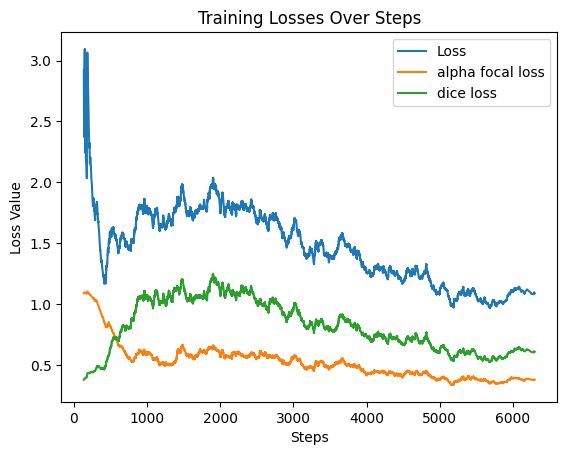

In [18]:
# Path to TensorBoard logs
log_dir = os.path.join(out_checkpoint_dir,"lightning-sam")

# Load logs
reader = SummaryReader(log_dir,extra_columns={'dir_name'})
df = reader.scalars

df['smoothed_value'] = smooth(df['value'],0.999)

df = df[df['dir_name'] == 'version_0']
Loss = df[df['tag']=='Loss']
alpha_focal_loss = df[df['tag'] == 'alpha focal loss']
dice_loss = df[df['tag'] == 'dice loss']
plt.plot(Loss['step'],Loss['smoothed_value'])
plt.plot(alpha_focal_loss['step'],alpha_focal_loss['smoothed_value'])
plt.plot(dice_loss['step'],dice_loss['smoothed_value'])
plt.xlabel('Steps')
plt.ylabel('Loss Value')
plt.legend(['Loss','alpha focal loss','dice loss'])
plt.title('Training Losses Over Steps')
plt.show()

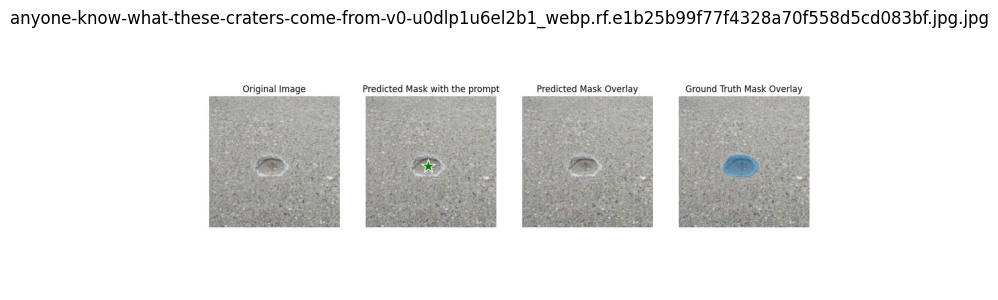

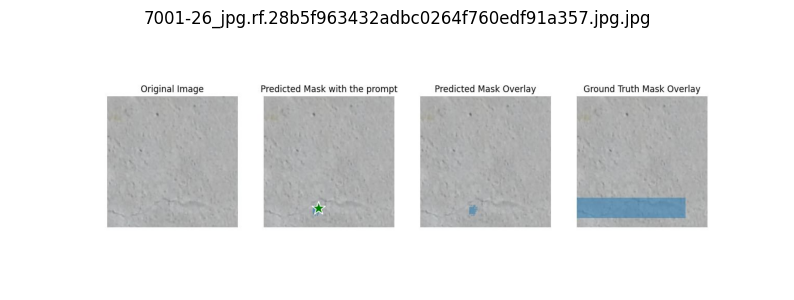

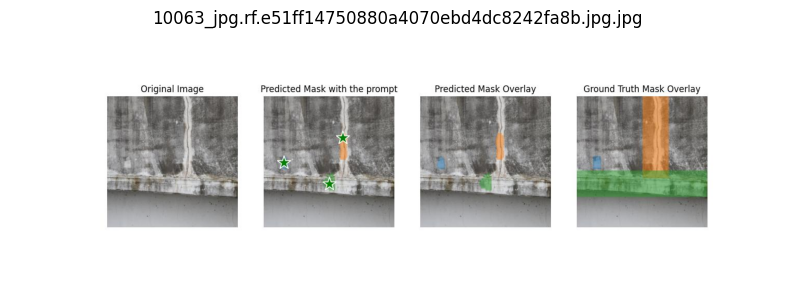

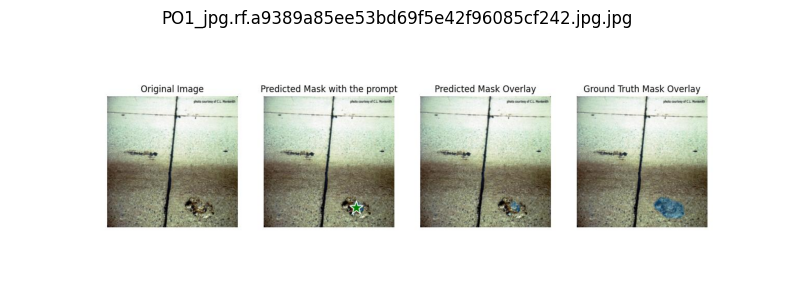

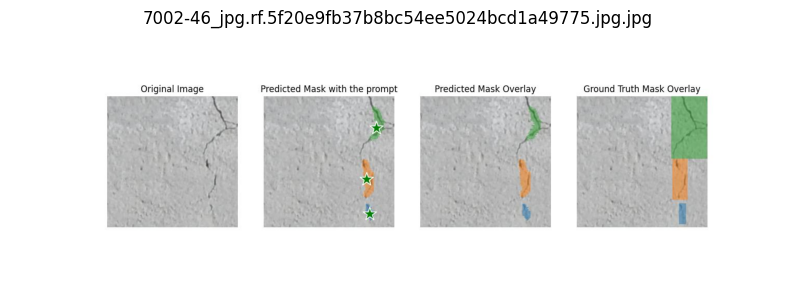

...

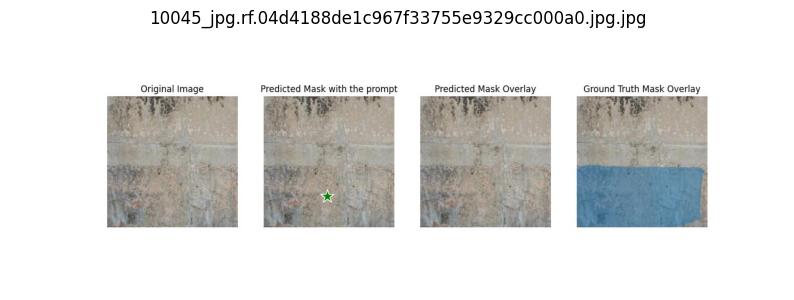

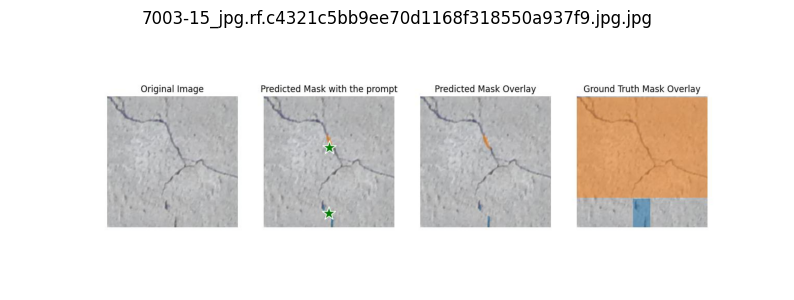

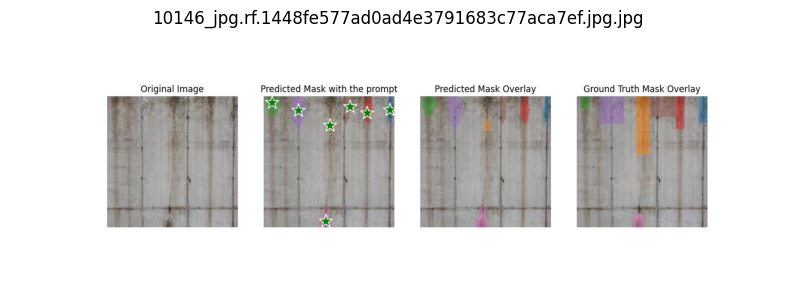

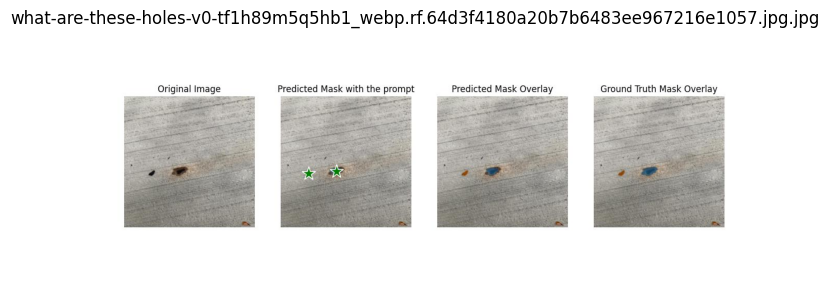

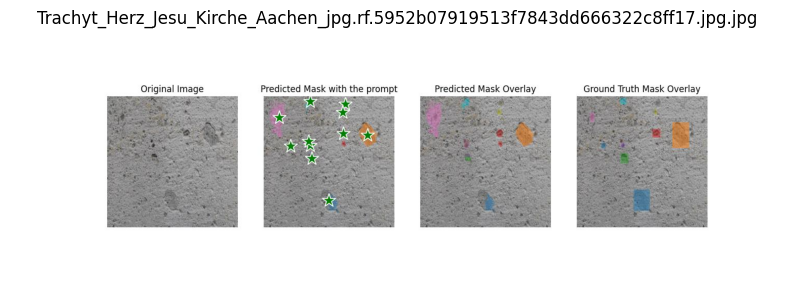

In [19]:
# List all saved images
images = [os.path.join(segmentated_val_imgs_dir, f) for f in os.listdir(segmentated_val_imgs_dir) if f.endswith(".jpg")]

# Display images in the notebook
for img_path in images:
    img = Image.open(img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    plt.show()

In [20]:
# Path to the saved checkpoint
finetuned_checkpoint = get_best_checkpoint(out_checkpoint_dir)

model = build_sam2(base_model_cfg,base_checkpoint_path)
model.load_state_dict(torch.load(finetuned_checkpoint, weights_only=True))
predictor = SAM2ImagePredictor(model)

model.eval()

SAM2Base(
  (image_encoder): ImageEncoder(
    (trunk): Hiera(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 112, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      )
      (blocks): ModuleList(
        (0-1): 2 x MultiScaleBlock(
          (norm1): LayerNorm((112,), eps=1e-06, elementwise_affine=True)
          (attn): MultiScaleAttention(
            (qkv): Linear(in_features=112, out_features=336, bias=True)
            (proj): Linear(in_features=112, out_features=112, bias=True)
          )
          (drop_path): Identity()
          (norm2): LayerNorm((112,), eps=1e-06, elementwise_affine=True)
          (mlp): MLP(
            (layers): ModuleList(
              (0): Linear(in_features=112, out_features=448, bias=True)
              (1): Linear(in_features=448, out_features=112, bias=True)
            )
            (act): GELU(approximate='none')
          )
        )
        (2): MultiScaleBlock(
          (norm1): LayerNorm((112,), eps=1e-06, elementwise_affi

In [48]:
process_images(rf_dataset.location)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
All images processed and saved!


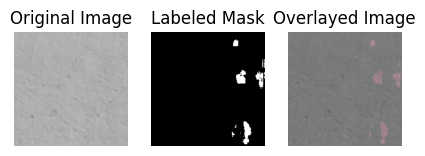

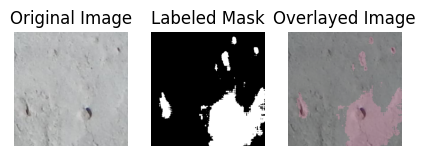

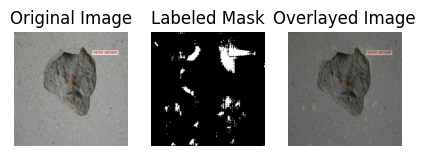

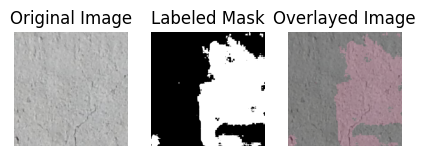

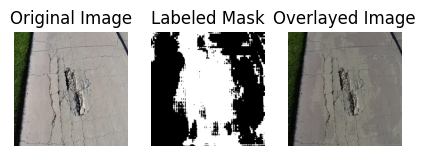

...

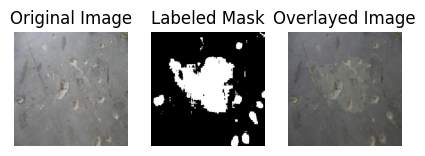

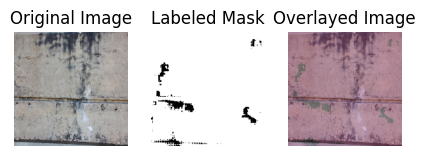

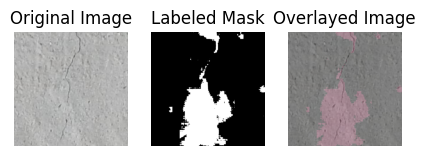

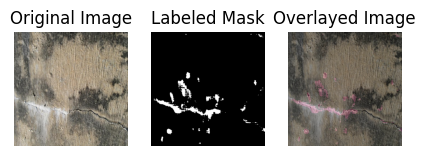

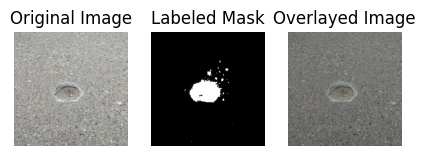

In [59]:
visualize_processed_images(base_predict_dir, 'valid')